In [1]:
import datetime
import os
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt 
import matplotlib as mpl
import pandas as pd

import sys
sys.path.append(os.path.abspath('..'))

from src.tree import TreeModel
from src.climate import BPWClimate
from src.emit_baseline import BPWEmissionBaseline
from src.damage import BPWDamage
from src.tools import import_csv
from src.analysis import output_unpacker

import importlib
importlib.reload(output_unpacker)

from src.analysis.output_unpacker import OutputUnpacker

node_times = [2020, 2025, 2030, 2035, 2060, 2100, 2150, 2200]

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 16, 10
params = {'legend.fontsize': 14,
          'legend.frameon': True,
          'figure.figsize': (16, 10),
         'axes.labelsize': 20,
         'axes.titlesize': 20,
         'xtick.labelsize': 18,
         'ytick.labelsize': 18,
         'font.family': 'serif'}
mpl.rcParams.update(params)

today = datetime.datetime.now()
year = str(today.year)
day = str(today.day)
month = str(today.month)

basefile = ''.join([month, '-', day, '-', year, '-'])

os.chdir('/user/tlm2160/cap6_tm')

In [3]:
delay_scenario = 'delay1_delayed'

prefix_list = [
    f'optimal/pref-run_delay1_optimal',
    f'optimal/pref-run_delay2_optimal',
    f'optimal/pref-run_delay3_optimal',
    f'delayed/pref-run_delay1_delayed',
    f'delayed/pref-run_delay2_delayed',
    f'delayed/pref-run_delay3_delayed',
]

path_list = [
    'data/multi-period-baseline/',
]

descriptions = [
    f'Optimal Policy 1',
    f'Optimal Policy 2',
    f'Optimal Policy 3',
    f'Delayed Policy 5yr',
    f'Delayed Policy 10yr',
    f'Delayed Policy 15yr',
]

decision_times_list = [
    [0, 5, 10, 15, 40, 70, 110, 160, 210],
    [0, 5, 10, 15, 40, 70, 110, 160, 210]
]

output_list = []
picklefile_list = []

N_files = len(prefix_list)
for path in path_list:
    for file in range(0, N_files):
        tmp_filename = path + prefix_list[file] + "_node_period_output.csv"
        tmp_picklefile_name = path + prefix_list[file] + "_log.pickle"
        output_list.append(tmp_filename)
        picklefile_list.append(tmp_picklefile_name)

In [4]:
data_csv_file = 'research_runs'
header, indices, data = import_csv(data_csv_file, delimiter=',', indices=2)
done_runs = [0]

models = {}

for counter in range(len(output_list)):
    tree_list = []
    damage_list = []
    climate_list = []
    emit_baseline_list = []

    for i in done_runs:
        ra, eis, pref, growth, tech_chg, tech_scale, dam_func,\
                baseline_num, tip_on, bs_premium, d_unc, t_unc, nfl = data[i]

        baseline_num = int(baseline_num)
        dam_func = int(dam_func)
        tip_on = int(tip_on)
        d_unc = int(d_unc)
        t_unc = int(t_unc)
        nfl = int(nfl)

        """Initialize model classes with EXTENDED decision times.
        Multi-period delays use: [0, 5, 10, 15, 40, 70, 110, 160, 210]
        """

        tmp_tree = TreeModel(decision_times=[0, 5, 10, 15, 40, 70, 110, 160, 210],
                    prob_scale=1.0)

        """Emission baseline model. We also run its setup function.
        """

        tmp_baseline_emission_model = BPWEmissionBaseline(tree=tmp_tree,
                                                    baseline_num=baseline_num)
        tmp_baseline_emission_model.baseline_emission_setup()

        """Climate class. We set draws to the number of Monte Carlo samples to take
        from damage distributions, such as TCRE, and if the floor is on.
        """

        draws = 3 * 10**6
        tmp_climate = BPWClimate(tmp_tree, tmp_baseline_emission_model, draws=draws)

        """Damage class. We set draws to the number of Monte Carlo samples to take
        from damage distributions, such as TCRE. We also pass a list of constant
        values of mitigation for the damage simulation.
        
        NOTE: We don't need to import the full damage simulation for visualization.
        The d_rcomb (recombined damage) values will be loaded from the pickle file
        in the next cell.
        """

        d_m = 0.1
        mitigation_constants = np.arange(0, 1 + d_m, d_m)[::-1]
        tmp_df = BPWDamage(tree=tmp_tree, emit_baseline=tmp_baseline_emission_model,
                    climate=tmp_climate, mitigation_constants=mitigation_constants,
                    draws=draws)

        # Skip damage import - we'll load d_rcomb from pickle file instead
        
        tree_list.append(tmp_tree)
        emit_baseline_list.append(tmp_baseline_emission_model)
        climate_list.append(tmp_climate)
        damage_list.append(tmp_df)

    models[counter] = {
        'tree': tree_list[0],
        'emit_baseline': emit_baseline_list[0],
        'climate': climate_list[0],
        'damage': damage_list[0]
    }

    print(f"Tree has {tmp_tree.num_decision_nodes} decision nodes")
    print(f"Decision times: {tmp_tree.decision_times}")
    print(f"Corresponding years: {[2020 + dt for dt in tmp_tree.decision_times]}")

Tree has 255 decision nodes
Decision times: [  0   5  10  15  40  70 110 160 210]
Corresponding years: [2020, 2025, 2030, 2035, 2060, 2090, 2130, 2180, 2230]
Tree has 255 decision nodes
Decision times: [  0   5  10  15  40  70 110 160 210]
Corresponding years: [2020, 2025, 2030, 2035, 2060, 2090, 2130, 2180, 2230]
Tree has 255 decision nodes
Decision times: [  0   5  10  15  40  70 110 160 210]
Corresponding years: [2020, 2025, 2030, 2035, 2060, 2090, 2130, 2180, 2230]
Tree has 255 decision nodes
Decision times: [  0   5  10  15  40  70 110 160 210]
Corresponding years: [2020, 2025, 2030, 2035, 2060, 2090, 2130, 2180, 2230]
Tree has 255 decision nodes
Decision times: [  0   5  10  15  40  70 110 160 210]
Corresponding years: [2020, 2025, 2030, 2035, 2060, 2090, 2130, 2180, 2230]
Tree has 255 decision nodes
Decision times: [  0   5  10  15  40  70 110 160 210]
Corresponding years: [2020, 2025, 2030, 2035, 2060, 2090, 2130, 2180, 2230]


In [5]:
output_obj_list = []
pickle_obj_list = []

import pickle

for counter in range(len(models)):
    with open(picklefile_list[counter], 'rb') as f:
        pickle_data = pickle.load(f)
    
    if 'df.d_rcomb' in pickle_data:
        models[counter]['damage'].d_rcomb = pickle_data['df.d_rcomb']
    print(output_list[counter])
    tmp_output_obj = OutputUnpacker(output_list[counter], descriptions, 'output', 
                                    tree=models[counter]['tree'], 
                                    emit_baseline=models[counter]['emit_baseline'],
                                    climate=models[counter]['climate'], 
                                    damage=models[counter]['damage'])
    output_obj_list.append(tmp_output_obj)
    
    tmp_pickle_obj = OutputUnpacker(picklefile_list[counter], descriptions, 'pickle',
                                    tree=models[counter]['tree'], 
                                    emit_baseline=models[counter]['emit_baseline'],
                                    climate=models[counter]['climate'], 
                                    damage=models[counter]['damage'])
    pickle_obj_list.append(tmp_pickle_obj)

data/multi-period-baseline/optimal/pref-run_delay1_optimal_node_period_output.csv
data/multi-period-baseline/optimal/pref-run_delay2_optimal_node_period_output.csv
data/multi-period-baseline/optimal/pref-run_delay3_optimal_node_period_output.csv
data/multi-period-baseline/delayed/pref-run_delay1_delayed_node_period_output.csv
data/multi-period-baseline/delayed/pref-run_delay2_delayed_node_period_output.csv
data/multi-period-baseline/delayed/pref-run_delay3_delayed_node_period_output.csv


In [6]:
# Configuration
SAVE_FIGURES = False

color_list = ['#aed6f1', '#f5b7b1', '#d7bde2', '#3498db', '#e74c3c' , '#9b59b6'] * 2
marker_list = ['o', 's', 'P', '+', 'D', 'v', '3'] * 2
markersize = 6
linestyle_list = ['dotted', 'dotted', 'dotted', 'solid', 'solid', 'solid'] * 2
linewidth = 2
x_label = 'Year'

import seaborn as sns

### Cost of Carbon

In [19]:
# Analyze ALL individual price paths (before averaging)
print("=== Individual Price Path Trend Analysis ===\n")

for file in range(N_files):
    price_path = output_obj_list[file].price_path  # Shape: (num_paths, num_periods)
    num_paths, num_periods = price_path.shape
    
    print(f"{descriptions[file]}:")
    print(f"  Number of paths: {num_paths}")
    print(f"  Number of time periods: {num_periods}")
    
    # Analyze each individual path
    increasing_count = 0
    decreasing_count = 0
    mixed_count = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(price_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_count += 1
        elif np.all(path_diffs <= 0):
            decreasing_count += 1
        else:
            mixed_count += 1
    
    print(f"  Monotonically INCREASING paths: {increasing_count} ({100*increasing_count/num_paths:.1f}%)")
    print(f"  Monotonically DECREASING paths: {decreasing_count} ({100*decreasing_count/num_paths:.1f}%)")
    print(f"  MIXED paths: {mixed_count} ({100*mixed_count/num_paths:.1f}%)")
    print()


=== Individual Price Path Trend Analysis ===

Optimal Policy 1:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 17 (13.3%)
  MIXED paths: 111 (86.7%)

Optimal Policy 2:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 15 (11.7%)
  MIXED paths: 113 (88.3%)

Optimal Policy 3:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 14 (10.9%)
  MIXED paths: 114 (89.1%)

Delayed Policy 5yr:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 0 (0.0%)
  MIXED paths: 128 (100.0%)

Delayed Policy 10yr:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 0 (0.0%)
  MIXED paths: 128 (100.0%)

Delayed Policy 15yr:
  Num

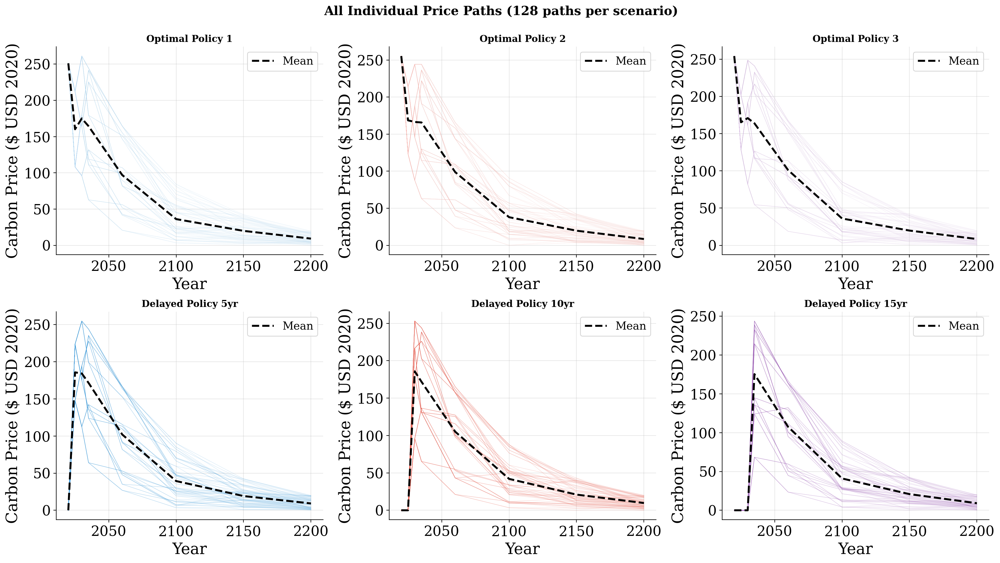

In [20]:
# Visualize ALL individual price paths (spaghetti plot)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for file in range(N_files):
    ax = axes[file]
    price_path = output_obj_list[file].price_path  # Shape: (num_paths, num_periods)
    num_paths = price_path.shape[0]
    
    # Plot each individual path with transparency
    for path_idx in range(num_paths):
        ax.plot(node_times, price_path[path_idx, :], 
                color=color_list[file], alpha=0.1, linewidth=0.5)
    
    # Plot the mean path on top with thicker line
    mean_prices = np.mean(price_path, axis=0)
    ax.plot(node_times, mean_prices, 
            color='black', linewidth=2.5, label='Mean', linestyle='--')
    
    ax.set_title(descriptions[file], fontsize=12, fontweight='bold')
    ax.set_ylabel("Carbon Price ($ USD 2020)")
    ax.set_xlabel("Year")
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.suptitle("All Individual Price Paths (128 paths per scenario)", fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, 'all-individual-price-paths.png']), dpi=400, bbox_inches='tight')

plt.show()


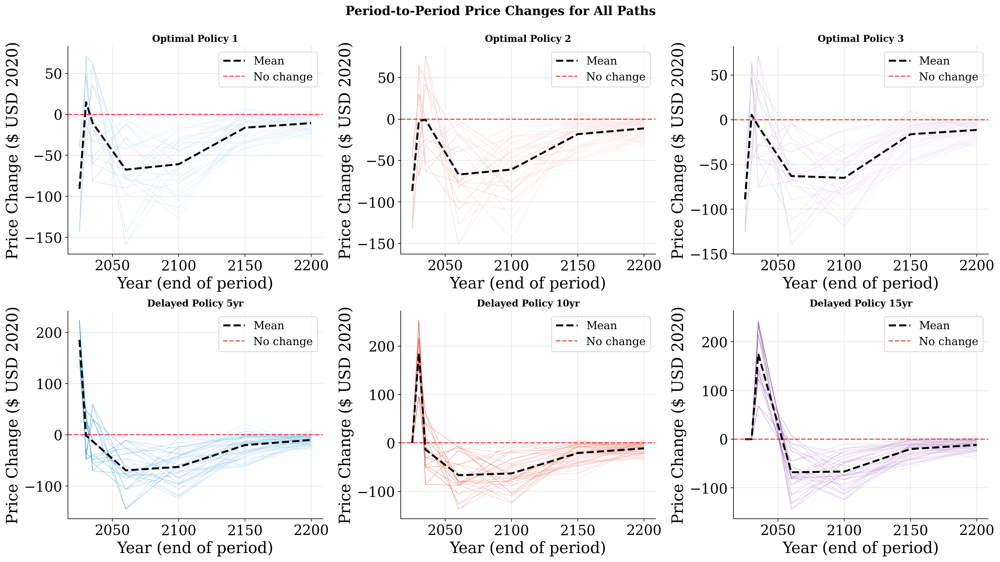

In [21]:
# Visualize period-to-period changes for ALL individual paths
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

node_times_diff = node_times[1:]  # For x-axis of differences

for file in range(N_files):
    ax = axes[file]
    price_path = output_obj_list[file].price_path  # Shape: (num_paths, num_periods)
    num_paths = price_path.shape[0]
    
    # Plot differences for each individual path
    for path_idx in range(num_paths):
        path_diffs = np.diff(price_path[path_idx, :])
        ax.plot(node_times_diff, path_diffs, 
                color=color_list[file], alpha=0.1, linewidth=0.5)
    
    # Plot the mean differences on top
    mean_diffs = np.diff(np.mean(price_path, axis=0))
    ax.plot(node_times_diff, mean_diffs, 
            color='black', linewidth=2.5, label='Mean', linestyle='--')
    
    # Add horizontal line at y=0
    ax.axhline(y=0, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='No change')
    
    ax.set_title(descriptions[file], fontsize=12, fontweight='bold')
    ax.set_ylabel("Price Change ($ USD 2020)")
    ax.set_xlabel("Year (end of period)")
    ax.legend()
    ax.grid(True, alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.suptitle("Period-to-Period Price Changes for All Paths", fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, 'all-individual-price-changes.png']), dpi=400, bbox_inches='tight')

plt.show()


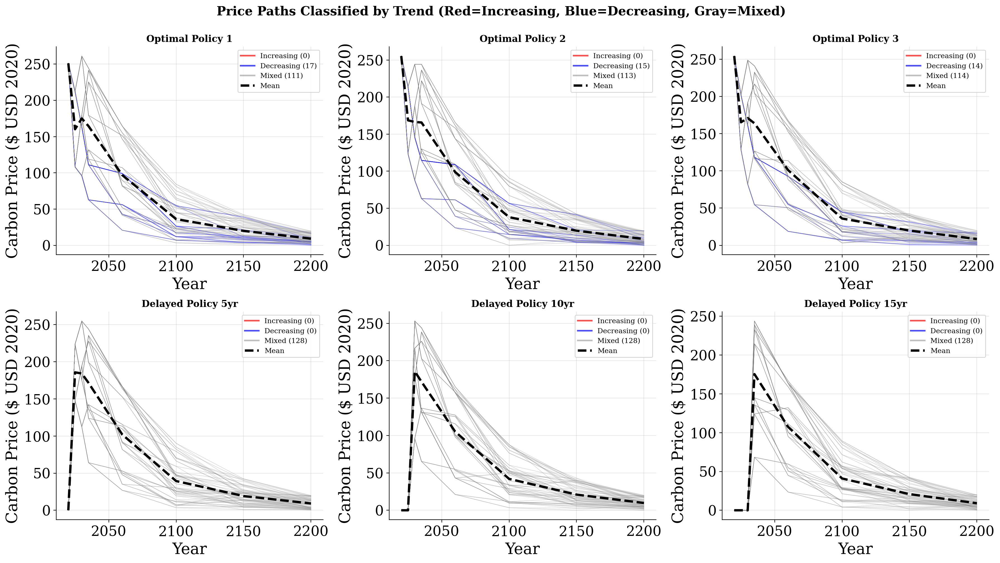

In [22]:
# Detailed analysis: Which paths are decreasing vs increasing over time
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for file in range(N_files):
    ax = axes[file]
    price_path = output_obj_list[file].price_path
    num_paths = price_path.shape[0]
    
    increasing_paths = []
    decreasing_paths = []
    mixed_paths = []
    
    # Classify each path
    for path_idx in range(num_paths):
        path_diffs = np.diff(price_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_paths.append(path_idx)
        elif np.all(path_diffs <= 0):
            decreasing_paths.append(path_idx)
        else:
            mixed_paths.append(path_idx)
    
    # Plot decreasing paths in blue
    for path_idx in decreasing_paths:
        ax.plot(node_times, price_path[path_idx, :], 
                color='blue', alpha=0.3, linewidth=0.8)
    
    # Plot increasing paths in red
    for path_idx in increasing_paths:
        ax.plot(node_times, price_path[path_idx, :], 
                color='red', alpha=0.3, linewidth=0.8)
    
    # Plot mixed paths in gray
    for path_idx in mixed_paths:
        ax.plot(node_times, price_path[path_idx, :], 
                color='gray', alpha=0.2, linewidth=0.5)
    
    # Plot mean
    mean_prices = np.mean(price_path, axis=0)
    ax.plot(node_times, mean_prices, 
            color='black', linewidth=3, label='Mean', linestyle='--')
    
    # Create custom legend
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='red', lw=2, alpha=0.7, label=f'Increasing ({len(increasing_paths)})'),
        Line2D([0], [0], color='blue', lw=2, alpha=0.7, label=f'Decreasing ({len(decreasing_paths)})'),
        Line2D([0], [0], color='gray', lw=2, alpha=0.5, label=f'Mixed ({len(mixed_paths)})'),
        Line2D([0], [0], color='black', lw=3, linestyle='--', label='Mean')
    ]
    
    ax.set_title(descriptions[file], fontsize=12, fontweight='bold')
    ax.set_ylabel("Carbon Price ($ USD 2020)")
    ax.set_xlabel("Year")
    ax.legend(handles=legend_elements, loc='best', fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.suptitle("Price Paths Classified by Trend (Red=Increasing, Blue=Decreasing, Gray=Mixed)", 
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, 'price-paths-classified.png']), dpi=400, bbox_inches='tight')

plt.show()


In [23]:
# Summary statistics table for all paths
import pandas as pd

summary_data = []

for file in range(N_files):
    price_path = output_obj_list[file].price_path
    num_paths, num_periods = price_path.shape
    
    increasing_count = 0
    decreasing_count = 0
    mixed_count = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(price_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_count += 1
        elif np.all(path_diffs <= 0):
            decreasing_count += 1
        else:
            mixed_count += 1
    
    # Calculate additional statistics
    first_period_prices = price_path[:, 0]
    last_period_prices = price_path[:, -1]
    net_changes = last_period_prices - first_period_prices
    
    summary_data.append({
        'Scenario': descriptions[file],
        'Total Paths': num_paths,
        'Increasing': increasing_count,
        'Increasing %': f"{100*increasing_count/num_paths:.1f}%",
        'Decreasing': decreasing_count,
        'Decreasing %': f"{100*decreasing_count/num_paths:.1f}%",
        'Mixed': mixed_count,
        'Mixed %': f"{100*mixed_count/num_paths:.1f}%",
        'Avg Net Change': f"{np.mean(net_changes):.2f}",
        'Min Net Change': f"{np.min(net_changes):.2f}",
        'Max Net Change': f"{np.max(net_changes):.2f}"
    })

summary_df = pd.DataFrame(summary_data)
print("\n" + "="*120)
print("SUMMARY: Price Path Trends Across All Scenarios")
print("="*120)
print(summary_df.to_string(index=False))
print("="*120)



SUMMARY: Price Path Trends Across All Scenarios
           Scenario  Total Paths  Increasing Increasing %  Decreasing Decreasing %  Mixed Mixed % Avg Net Change Min Net Change Max Net Change
   Optimal Policy 1          128           0         0.0%          17        13.3%    111   86.7%        -241.88        -251.11        -231.14
   Optimal Policy 2          128           0         0.0%          15        11.7%    113   88.3%        -246.83        -255.31        -235.55
   Optimal Policy 3          128           0         0.0%          14        10.9%    114   89.1%        -246.02        -254.46        -234.44
 Delayed Policy 5yr          128           0         0.0%           0         0.0%    128  100.0%           9.21           0.00          20.09
Delayed Policy 10yr          128           0         0.0%           0         0.0%    128  100.0%           9.71           0.00          20.19
Delayed Policy 15yr          128           0         0.0%           0         0.0%    128  10

## Mitigation Fraction Analysis - All Individual Paths

In [26]:
# Analyze ALL individual mitigation paths
print("=== Individual Mitigation Path Trend Analysis ===\n")

for file in range(N_files):
    mit_path = pickle_obj_list[file].m_opt_path  # Mitigation fraction paths
    num_paths, num_periods = mit_path.shape
    
    print(f"{descriptions[file]}:")
    print(f"  Number of paths: {num_paths}")
    print(f"  Number of time periods: {num_periods}")
    
    # Analyze each individual path
    increasing_count = 0
    decreasing_count = 0
    mixed_count = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(mit_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_count += 1
        elif np.all(path_diffs <= 0):
            decreasing_count += 1
        else:
            mixed_count += 1
    
    print(f"  Monotonically INCREASING paths: {increasing_count} ({100*increasing_count/num_paths:.1f}%)")
    print(f"  Monotonically DECREASING paths: {decreasing_count} ({100*decreasing_count/num_paths:.1f}%)")
    print(f"  MIXED paths: {mixed_count} ({100*mixed_count/num_paths:.1f}%)")
    print()


=== Individual Mitigation Path Trend Analysis ===

Optimal Policy 1:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 0 (0.0%)
  MIXED paths: 128 (100.0%)

Optimal Policy 2:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 1 (0.8%)
  MIXED paths: 127 (99.2%)

Optimal Policy 3:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 0 (0.0%)
  MIXED paths: 128 (100.0%)

Delayed Policy 5yr:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 0 (0.0%)
  MIXED paths: 128 (100.0%)

Delayed Policy 10yr:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 0 (0.0%)
  MIXED paths: 128 (100.0%)

Delayed Policy 15yr:
  Nu

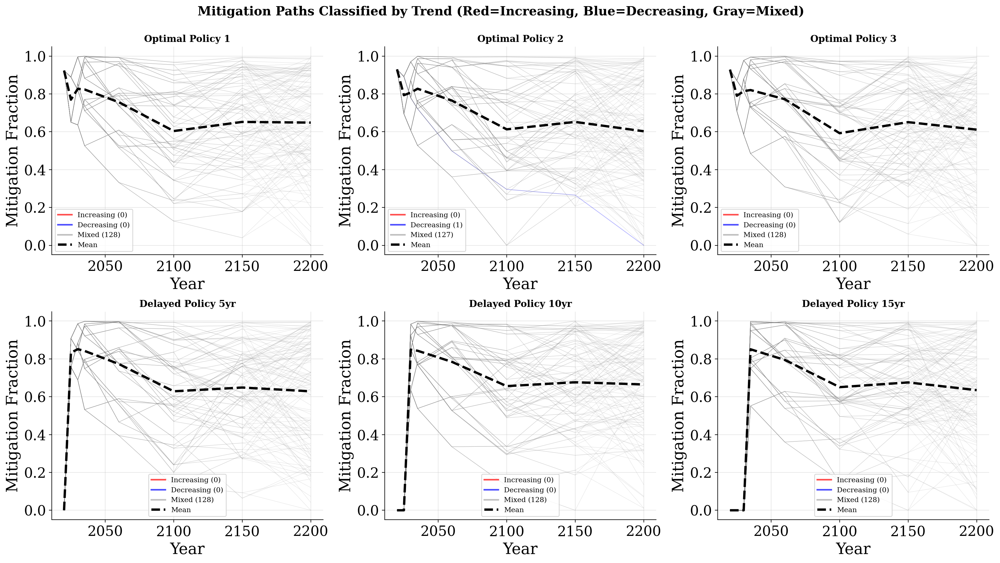

In [27]:
# Visualize ALL individual mitigation paths - classified by trend
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for file in range(N_files):
    ax = axes[file]
    mit_path = pickle_obj_list[file].m_opt_path
    num_paths = mit_path.shape[0]
    
    increasing_paths = []
    decreasing_paths = []
    mixed_paths = []
    
    # Classify each path
    for path_idx in range(num_paths):
        path_diffs = np.diff(mit_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_paths.append(path_idx)
        elif np.all(path_diffs <= 0):
            decreasing_paths.append(path_idx)
        else:
            mixed_paths.append(path_idx)
    
    # Plot decreasing paths in blue
    for path_idx in decreasing_paths:
        ax.plot(node_times, mit_path[path_idx, :], 
                color='blue', alpha=0.3, linewidth=0.8)
    
    # Plot increasing paths in red
    for path_idx in increasing_paths:
        ax.plot(node_times, mit_path[path_idx, :], 
                color='red', alpha=0.3, linewidth=0.8)
    
    # Plot mixed paths in gray
    for path_idx in mixed_paths:
        ax.plot(node_times, mit_path[path_idx, :], 
                color='gray', alpha=0.2, linewidth=0.5)
    
    # Plot mean
    mean_mit = np.mean(mit_path, axis=0)
    ax.plot(node_times, mean_mit, 
            color='black', linewidth=3, label='Mean', linestyle='--')
    
    # Create custom legend
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='red', lw=2, alpha=0.7, label=f'Increasing ({len(increasing_paths)})'),
        Line2D([0], [0], color='blue', lw=2, alpha=0.7, label=f'Decreasing ({len(decreasing_paths)})'),
        Line2D([0], [0], color='gray', lw=2, alpha=0.5, label=f'Mixed ({len(mixed_paths)})'),
        Line2D([0], [0], color='black', lw=3, linestyle='--', label='Mean')
    ]
    
    ax.set_title(descriptions[file], fontsize=12, fontweight='bold')
    ax.set_ylabel("Mitigation Fraction")
    ax.set_xlabel("Year")
    ax.set_ylim(-0.05, 1.05)
    ax.legend(handles=legend_elements, loc='best', fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.suptitle("Mitigation Paths Classified by Trend (Red=Increasing, Blue=Decreasing, Gray=Mixed)", 
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, 'mitigation-paths-classified.png']), dpi=400, bbox_inches='tight')

plt.show()


In [28]:
# Summary statistics table for mitigation paths
summary_data_mit = []

for file in range(N_files):
    mit_path = pickle_obj_list[file].m_opt_path
    num_paths, num_periods = mit_path.shape
    
    increasing_count = 0
    decreasing_count = 0
    mixed_count = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(mit_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_count += 1
        elif np.all(path_diffs <= 0):
            decreasing_count += 1
        else:
            mixed_count += 1
    
    # Calculate additional statistics
    first_period_mit = mit_path[:, 0]
    last_period_mit = mit_path[:, -1]
    net_changes = last_period_mit - first_period_mit
    
    summary_data_mit.append({
        'Scenario': descriptions[file],
        'Total Paths': num_paths,
        'Increasing': increasing_count,
        'Increasing %': f"{100*increasing_count/num_paths:.1f}%",
        'Decreasing': decreasing_count,
        'Decreasing %': f"{100*decreasing_count/num_paths:.1f}%",
        'Mixed': mixed_count,
        'Mixed %': f"{100*mixed_count/num_paths:.1f}%",
        'Avg Net Change': f"{np.mean(net_changes):.3f}",
        'Min Net Change': f"{np.min(net_changes):.3f}",
        'Max Net Change': f"{np.max(net_changes):.3f}"
    })

summary_df_mit = pd.DataFrame(summary_data_mit)
print("\n" + "="*120)
print("SUMMARY: Mitigation Path Trends Across All Scenarios")
print("="*120)
print(summary_df_mit.to_string(index=False))
print("="*120)



SUMMARY: Mitigation Path Trends Across All Scenarios
           Scenario  Total Paths  Increasing Increasing %  Decreasing Decreasing %  Mixed Mixed % Avg Net Change Min Net Change Max Net Change
   Optimal Policy 1          128           0         0.0%           0         0.0%    128  100.0%         -0.275         -0.923          0.072
   Optimal Policy 2          128           0         0.0%           1         0.8%    127   99.2%         -0.327         -0.930          0.061
   Optimal Policy 3          128           0         0.0%           0         0.0%    128  100.0%         -0.317         -0.928          0.068
 Delayed Policy 5yr          128           0         0.0%           0         0.0%    128  100.0%          0.629          0.000          0.997
Delayed Policy 10yr          128           0         0.0%           0         0.0%    128  100.0%          0.665          0.000          0.999
Delayed Policy 15yr          128           0         0.0%           0         0.0%    12

## GHG Level Analysis - All Individual Paths

In [29]:
# Analyze ALL individual GHG level paths
print("=== Individual GHG Level Path Trend Analysis ===\n")

for file in range(N_files):
    ghg_path = output_obj_list[file].ghg_lvl_path  # GHG concentration paths
    num_paths, num_periods = ghg_path.shape
    
    print(f"{descriptions[file]}:")
    print(f"  Number of paths: {num_paths}")
    print(f"  Number of time periods: {num_periods}")
    
    # Analyze each individual path
    increasing_count = 0
    decreasing_count = 0
    mixed_count = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(ghg_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_count += 1
        elif np.all(path_diffs <= 0):
            decreasing_count += 1
        else:
            mixed_count += 1
    
    print(f"  Monotonically INCREASING paths: {increasing_count} ({100*increasing_count/num_paths:.1f}%)")
    print(f"  Monotonically DECREASING paths: {decreasing_count} ({100*decreasing_count/num_paths:.1f}%)")
    print(f"  MIXED paths: {mixed_count} ({100*mixed_count/num_paths:.1f}%)")
    print()


=== Individual GHG Level Path Trend Analysis ===

Optimal Policy 1:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 32 (25.0%)
  MIXED paths: 96 (75.0%)

Optimal Policy 2:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 32 (25.0%)
  MIXED paths: 96 (75.0%)

Optimal Policy 3:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 32 (25.0%)
  MIXED paths: 96 (75.0%)

Delayed Policy 5yr:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 0 (0.0%)
  MIXED paths: 128 (100.0%)

Delayed Policy 10yr:
  Number of paths: 128
  Number of time periods: 8
  Monotonically INCREASING paths: 0 (0.0%)
  Monotonically DECREASING paths: 0 (0.0%)
  MIXED paths: 128 (100.0%)

Delayed Policy 15yr:
  Nu

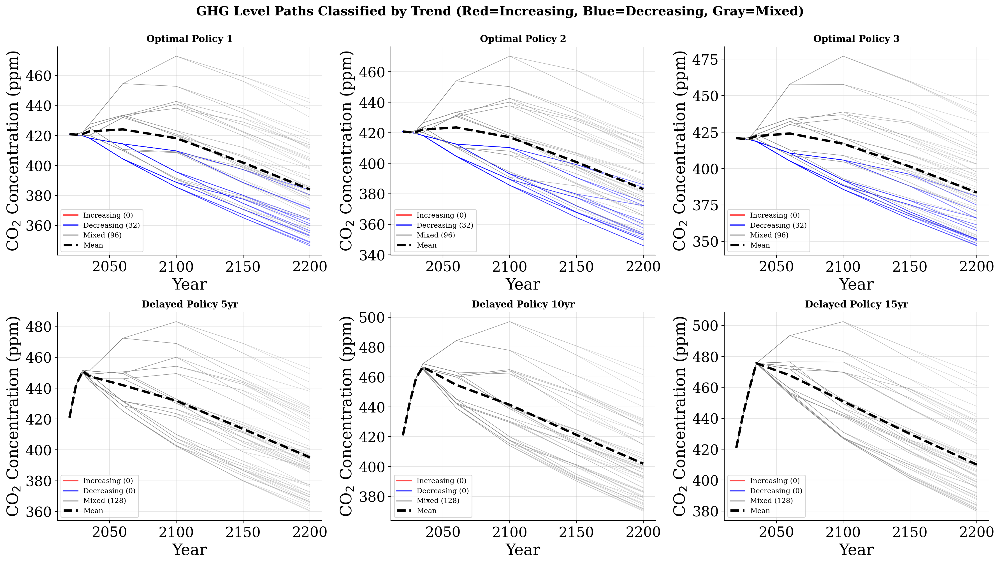

In [33]:
# Visualize ALL individual GHG level paths - classified by trend
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for file in range(N_files):
    ax = axes[file]
    ghg_path = output_obj_list[file].ghg_lvl_path
    num_paths = ghg_path.shape[0]
    
    increasing_paths = []
    decreasing_paths = []
    mixed_paths = []
    
    # Classify each path
    for path_idx in range(num_paths):
        path_diffs = np.diff(ghg_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_paths.append(path_idx)
        elif np.all(path_diffs <= 0):
            decreasing_paths.append(path_idx)
        else:
            mixed_paths.append(path_idx)
    
    # Plot decreasing paths in blue
    for path_idx in decreasing_paths:
        ax.plot(node_times, ghg_path[path_idx, :], 
                color='blue', alpha=0.3, linewidth=0.8)
    
    # Plot increasing paths in red
    for path_idx in increasing_paths:
        ax.plot(node_times, ghg_path[path_idx, :], 
                color='red', alpha=0.3, linewidth=0.8)
    
    # Plot mixed paths in gray
    for path_idx in mixed_paths:
        ax.plot(node_times, ghg_path[path_idx, :], 
                color='gray', alpha=0.2, linewidth=0.5)
    
    # Plot mean
    mean_ghg = np.mean(ghg_path, axis=0)
    ax.plot(node_times, mean_ghg, 
            color='black', linewidth=3, label='Mean', linestyle='--')
    
    # Create custom legend
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='red', lw=2, alpha=0.7, label=f'Increasing ({len(increasing_paths)})'),
        Line2D([0], [0], color='blue', lw=2, alpha=0.7, label=f'Decreasing ({len(decreasing_paths)})'),
        Line2D([0], [0], color='gray', lw=2, alpha=0.5, label=f'Mixed ({len(mixed_paths)})'),
        Line2D([0], [0], color='black', lw=3, linestyle='--', label='Mean')
    ]
    
    ax.set_title(descriptions[file], fontsize=12, fontweight='bold')
    ax.set_ylabel("CO$_2$ Concentration (ppm)")
    ax.set_xlabel("Year")
    ax.legend(handles=legend_elements, loc='best', fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.suptitle("GHG Level Paths Classified by Trend (Red=Increasing, Blue=Decreasing, Gray=Mixed)", 
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, 'ghg-paths-classified.png']), dpi=400, bbox_inches='tight')

plt.show()


In [31]:
# Summary statistics table for GHG level paths
summary_data_ghg = []

for file in range(N_files):
    ghg_path = output_obj_list[file].ghg_lvl_path
    num_paths, num_periods = ghg_path.shape
    
    increasing_count = 0
    decreasing_count = 0
    mixed_count = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(ghg_path[path_idx, :])
        
        if np.all(path_diffs >= 0):
            increasing_count += 1
        elif np.all(path_diffs <= 0):
            decreasing_count += 1
        else:
            mixed_count += 1
    
    # Calculate additional statistics
    first_period_ghg = ghg_path[:, 0]
    last_period_ghg = ghg_path[:, -1]
    net_changes = last_period_ghg - first_period_ghg
    
    summary_data_ghg.append({
        'Scenario': descriptions[file],
        'Total Paths': num_paths,
        'Increasing': increasing_count,
        'Increasing %': f"{100*increasing_count/num_paths:.1f}%",
        'Decreasing': decreasing_count,
        'Decreasing %': f"{100*decreasing_count/num_paths:.1f}%",
        'Mixed': mixed_count,
        'Mixed %': f"{100*mixed_count/num_paths:.1f}%",
        'Avg Net Change': f"{np.mean(net_changes):.2f}",
        'Min Net Change': f"{np.min(net_changes):.2f}",
        'Max Net Change': f"{np.max(net_changes):.2f}"
    })

summary_df_ghg = pd.DataFrame(summary_data_ghg)
print("\n" + "="*120)
print("SUMMARY: GHG Level Path Trends Across All Scenarios")
print("="*120)
print(summary_df_ghg.to_string(index=False))
print("="*120)



SUMMARY: GHG Level Path Trends Across All Scenarios
           Scenario  Total Paths  Increasing Increasing %  Decreasing Decreasing %  Mixed Mixed % Avg Net Change Min Net Change Max Net Change
   Optimal Policy 1          128           0         0.0%          32        25.0%     96   75.0%         -36.84         -74.31          23.36
   Optimal Policy 2          128           0         0.0%          32        25.0%     96   75.0%         -37.80         -74.92          20.83
   Optimal Policy 3          128           0         0.0%          32        25.0%     96   75.0%         -37.33         -73.76          22.99
 Delayed Policy 5yr          128           0         0.0%           0         0.0%    128  100.0%         -25.73         -60.58          31.71
Delayed Policy 10yr          128           0         0.0%           0         0.0%    128  100.0%         -18.91         -50.74          44.14
Delayed Policy 15yr          128           0         0.0%           0         0.0%    128

## Combined Comparison: Price, Mitigation, and GHG Trends

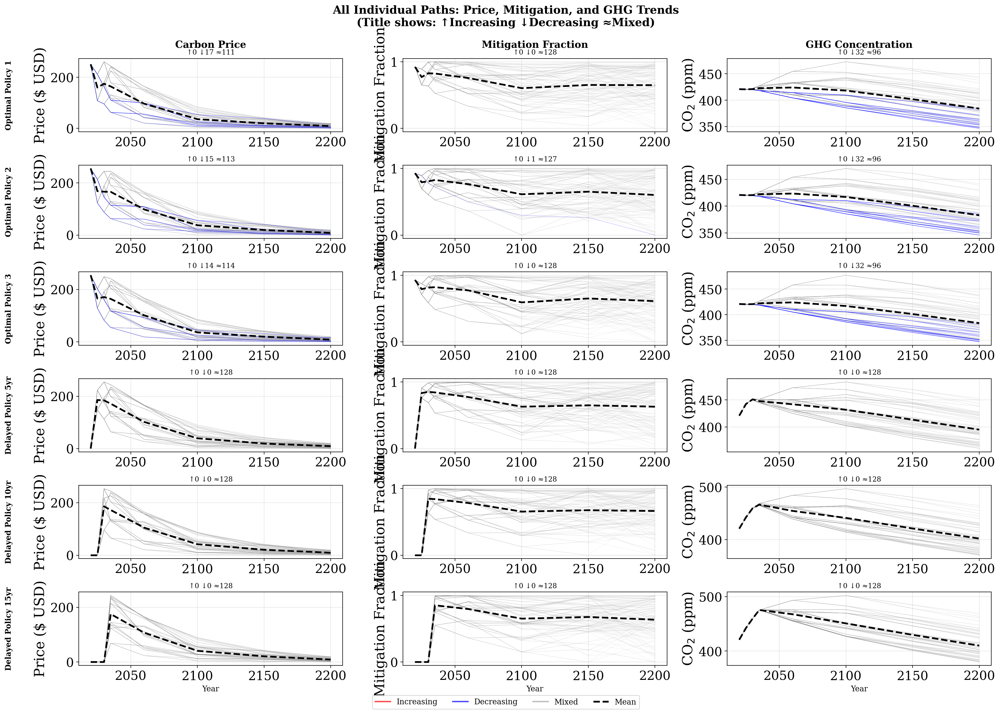

In [34]:
# Combined visualization: Compare trends across all three variables
fig, axes = plt.subplots(N_files, 3, figsize=(20, 14))

for file in range(N_files):
    # Price paths
    ax_price = axes[file, 0]
    price_path = output_obj_list[file].price_path
    num_paths = price_path.shape[0]
    
    price_increasing = 0
    price_decreasing = 0
    price_mixed = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(price_path[path_idx, :])
        if np.all(path_diffs >= 0):
            ax_price.plot(node_times, price_path[path_idx, :], color='red', alpha=0.3, linewidth=0.5)
            price_increasing += 1
        elif np.all(path_diffs <= 0):
            ax_price.plot(node_times, price_path[path_idx, :], color='blue', alpha=0.3, linewidth=0.5)
            price_decreasing += 1
        else:
            ax_price.plot(node_times, price_path[path_idx, :], color='gray', alpha=0.2, linewidth=0.3)
            price_mixed += 1
    
    ax_price.plot(node_times, np.mean(price_path, axis=0), 'k--', linewidth=2.5, label='Mean')
    ax_price.set_ylabel("Price ($ USD)")
    ax_price.set_title(f"↑{price_increasing} ↓{price_decreasing} ≈{price_mixed}", fontsize=10)
    ax_price.grid(True, alpha=0.3)
    
    # Mitigation paths
    ax_mit = axes[file, 1]
    mit_path = pickle_obj_list[file].m_opt_path
    
    mit_increasing = 0
    mit_decreasing = 0
    mit_mixed = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(mit_path[path_idx, :])
        if np.all(path_diffs >= 0):
            ax_mit.plot(node_times, mit_path[path_idx, :], color='red', alpha=0.3, linewidth=0.5)
            mit_increasing += 1
        elif np.all(path_diffs <= 0):
            ax_mit.plot(node_times, mit_path[path_idx, :], color='blue', alpha=0.3, linewidth=0.5)
            mit_decreasing += 1
        else:
            ax_mit.plot(node_times, mit_path[path_idx, :], color='gray', alpha=0.2, linewidth=0.3)
            mit_mixed += 1
    
    ax_mit.plot(node_times, np.mean(mit_path, axis=0), 'k--', linewidth=2.5, label='Mean')
    ax_mit.set_ylabel("Mitigation Fraction")
    ax_mit.set_title(f"↑{mit_increasing} ↓{mit_decreasing} ≈{mit_mixed}", fontsize=10)
    ax_mit.set_ylim(-0.05, 1.05)
    ax_mit.grid(True, alpha=0.3)
    
    # GHG paths
    ax_ghg = axes[file, 2]
    ghg_path = output_obj_list[file].ghg_lvl_path
    
    ghg_increasing = 0
    ghg_decreasing = 0
    ghg_mixed = 0
    
    for path_idx in range(num_paths):
        path_diffs = np.diff(ghg_path[path_idx, :])
        if np.all(path_diffs >= 0):
            ax_ghg.plot(node_times, ghg_path[path_idx, :], color='red', alpha=0.3, linewidth=0.5)
            ghg_increasing += 1
        elif np.all(path_diffs <= 0):
            ax_ghg.plot(node_times, ghg_path[path_idx, :], color='blue', alpha=0.3, linewidth=0.5)
            ghg_decreasing += 1
        else:
            ax_ghg.plot(node_times, ghg_path[path_idx, :], color='gray', alpha=0.2, linewidth=0.3)
            ghg_mixed += 1
    
    ax_ghg.plot(node_times, np.mean(ghg_path, axis=0), 'k--', linewidth=2.5, label='Mean')
    ax_ghg.set_ylabel("CO$_2$ (ppm)")
    ax_ghg.set_title(f"↑{ghg_increasing} ↓{ghg_decreasing} ≈{ghg_mixed}", fontsize=10)
    ax_ghg.grid(True, alpha=0.3)
    
    # Add scenario label on left
    axes[file, 0].text(-0.25, 0.5, descriptions[file], 
                       transform=axes[file, 0].transAxes,
                       fontsize=11, fontweight='bold', 
                       rotation=90, va='center', ha='right')

# Column titles
axes[0, 0].text(0.5, 1.15, 'Carbon Price', transform=axes[0, 0].transAxes,
                fontsize=14, fontweight='bold', ha='center')
axes[0, 1].text(0.5, 1.15, 'Mitigation Fraction', transform=axes[0, 1].transAxes,
                fontsize=14, fontweight='bold', ha='center')
axes[0, 2].text(0.5, 1.15, 'GHG Concentration', transform=axes[0, 2].transAxes,
                fontsize=14, fontweight='bold', ha='center')

# Set x-labels only on bottom row
for col in range(3):
    axes[-1, col].set_xlabel("Year", fontsize=11)

# Add legend
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', lw=2, alpha=0.7, label='Increasing'),
    Line2D([0], [0], color='blue', lw=2, alpha=0.7, label='Decreasing'),
    Line2D([0], [0], color='gray', lw=2, alpha=0.5, label='Mixed'),
    Line2D([0], [0], color='black', lw=2.5, linestyle='--', label='Mean')
]
fig.legend(handles=legend_elements, loc='lower center', ncol=4, 
           fontsize=11, bbox_to_anchor=(0.5, -0.02))

plt.suptitle("All Individual Paths: Price, Mitigation, and GHG Trends\n(Title shows: ↑Increasing ↓Decreasing ≈Mixed)", 
             fontsize=16, fontweight='bold', y=0.995)

plt.tight_layout()

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, 'combined-all-paths-comparison.png']), dpi=400, bbox_inches='tight')

plt.show()


251.11265976844513
255.30762093002983
254.45556963004861


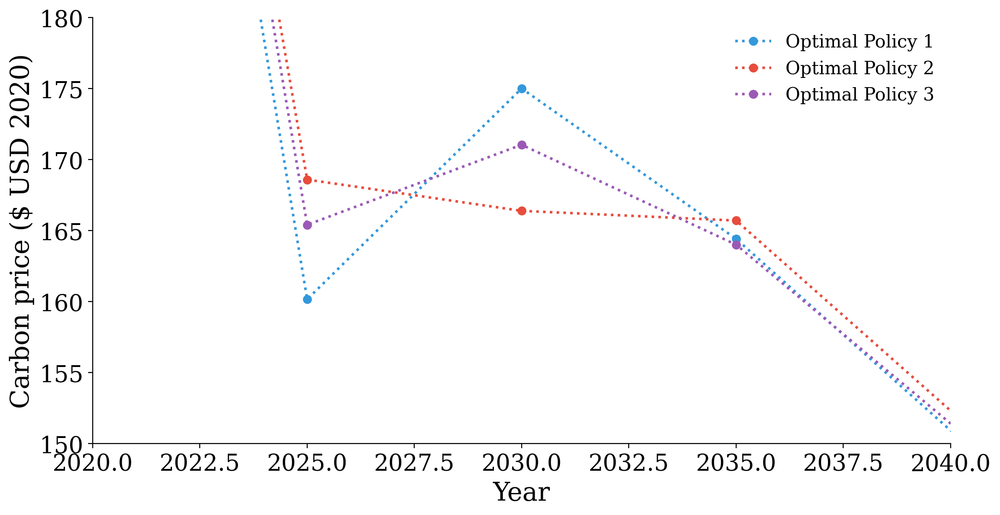

In [11]:
fig, ax = plt.subplots(1, figsize=(12,6))

for file in range(0, 3): # N_files
    ax.plot(node_times, np.mean(output_obj_list[file].price_path, axis=0), 
                  color=color_list[file+3], marker='o', 
                  label=pickle_obj_list[file].description[file], markersize=markersize,
                  linestyle=linestyle_list[file], linewidth=linewidth)
    print(np.mean(output_obj_list[file].price_path, axis=0)[0])


ax.set_ylabel("Carbon price ($ USD 2020)")
ax.legend(frameon=False)
ax.set_xlabel(x_label)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.set_ylim((-5,300))
#ax.set_yticks([0,50, 100,150, 200, 250, 300])
#ax.set_xticks([2020, 2100, 2200])
ax.set_ylim((150,180))
ax.set_xlim((2020,2040))
#sns.despine(trim=True, offset=10)



if SAVE_FIGURES:
    fig.savefig(''.join([basefile, fig_filename_prefix, '-cost.png']), dpi=400)

### Average mitigation

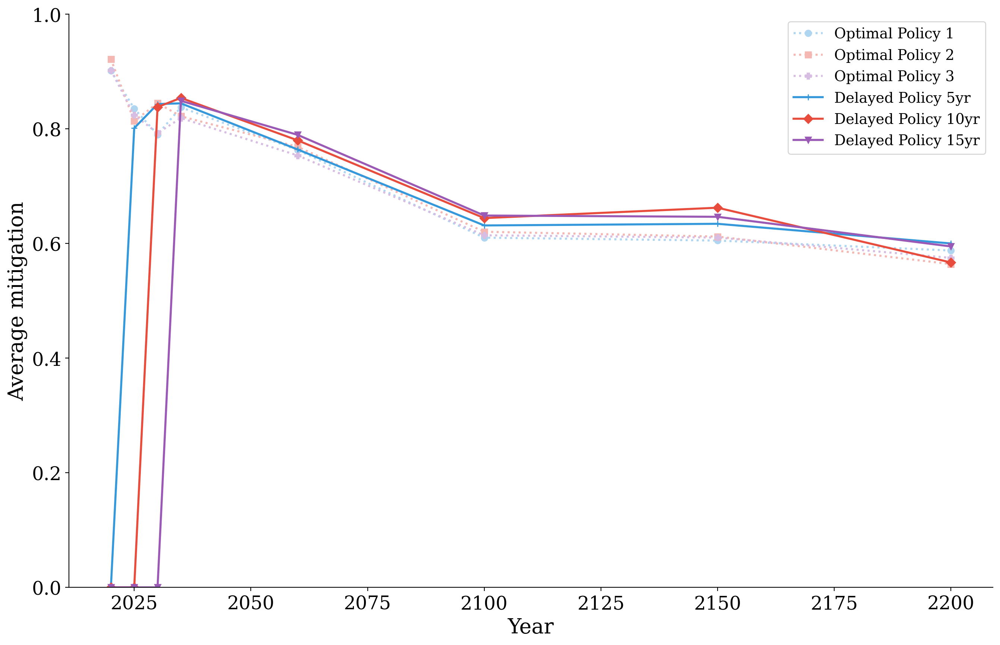

In [13]:
fig, ax = plt.subplots(1)

for file in range(0, N_files):
    ax.plot(node_times, np.mean(pickle_obj_list[file].m_opt_path, axis=0), 
            color=color_list[file], marker=marker_list[file], 
            label=pickle_obj_list[file].description[file], markersize=markersize,
            linestyle=linestyle_list[file], linewidth=linewidth)

ax.set_ylabel("Average mitigation")
ax.legend()
ax.set_xlabel(x_label)
ax.tick_params(axis='both')
#ax.axhline(1, color='g', linestyle='dashed')
ax.set_ylim((0,1.0))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, fig_filename_prefix, '-mit.png']), dpi=400)

### Expected mitigation

Difference from average, as this is the weighted average of mitigation

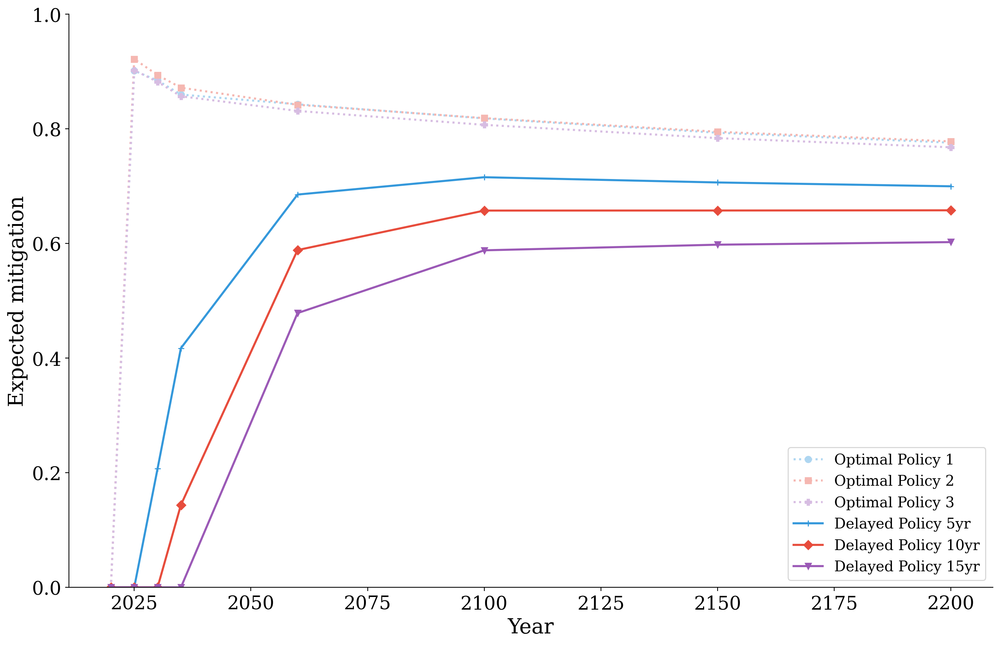

In [14]:
fig, ax = plt.subplots()

for file in range(0, N_files):
    ax.plot(node_times, np.mean(output_obj_list[file].exp_mit_path, axis=0), 
            color=color_list[file], marker=marker_list[file], 
            label=pickle_obj_list[file].description[file], markersize=markersize,
            linestyle=linestyle_list[file], linewidth=linewidth)

ax.set_ylabel("Expected mitigation")
ax.legend()
ax.set_xlabel(x_label)
#ax.axhline(1, color='g', linestyle='dashed')
ax.set_ylim((0,1.0))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, fig_filename_prefix, '-exp-mit.png']), dpi=400)

### (Mitigated) emissions

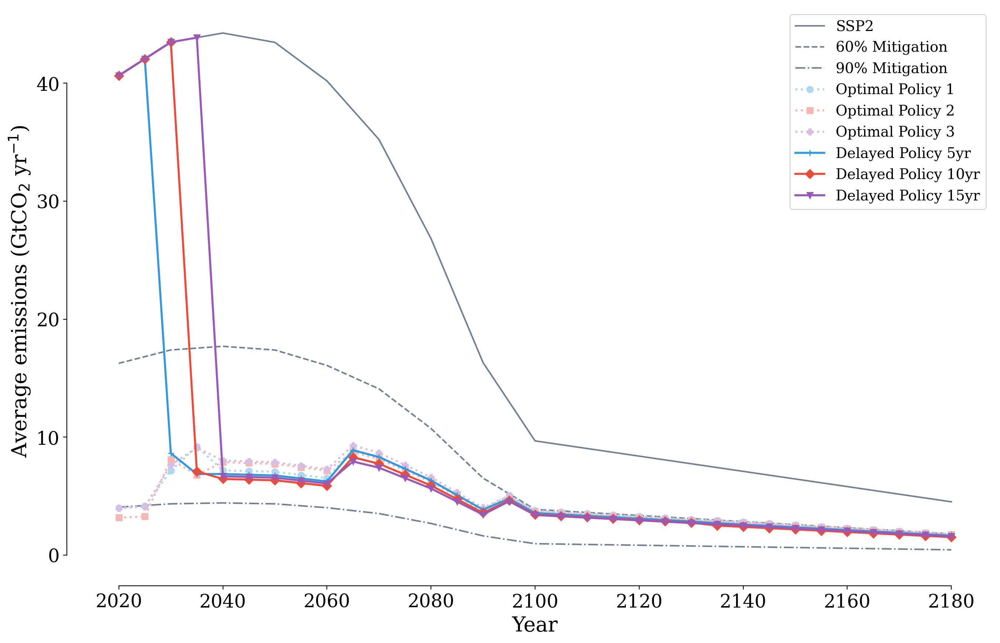

In [15]:
fig, ax = plt.subplots()

trigger = 10

ax.plot(tmp_baseline_emission_model.times[:-trigger], tmp_baseline_emission_model.baseline_gtco2[:-trigger], 
        color='slategrey', label="SSP2")
ax.plot(tmp_baseline_emission_model.times[:-trigger], (1 - 0.6) * tmp_baseline_emission_model.baseline_gtco2[:-trigger], 
        color='slategrey', label="60% Mitigation", linestyle="dashed")
ax.plot(tmp_baseline_emission_model.times[:-trigger], (1 - 0.9) * tmp_baseline_emission_model.baseline_gtco2[:-trigger], 
        color='slategrey', label="90% Mitigation", linestyle="dashdot")

for file in range(0, N_files):
    ax.plot(tmp_baseline_emission_model.times[:-trigger], np.mean(pickle_obj_list[file].emis_gtco2_full, axis=0), 
                  color=color_list[file], marker=marker_list[file], 
                  label=pickle_obj_list[file].description[file], markersize=markersize,
                  linestyle=linestyle_list[file], linewidth=linewidth)

    
ax.set_ylabel("Average emissions (GtCO$_2$ yr$^{-1}$)")
ax.set_xlabel(x_label)
sns.despine(trim=True, offset=10)
ax.legend()

### Average temperature

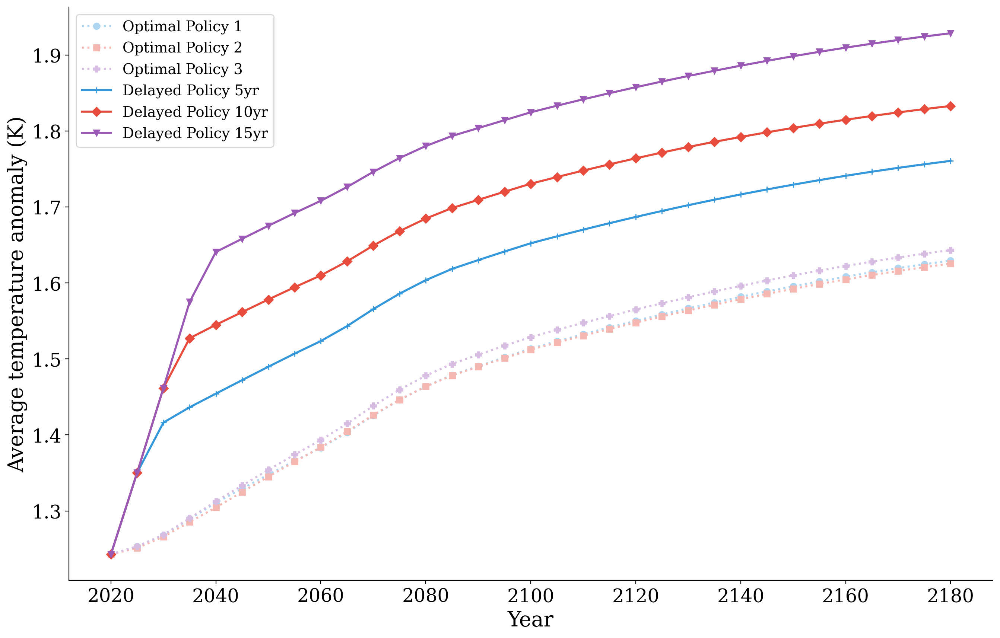

In [10]:
fig, ax = plt.subplots()

for file in range(0, N_files):
    ax.plot(tmp_baseline_emission_model.times[:-trigger], np.mean(pickle_obj_list[file].temp_full, axis=0), 
                  color=color_list[file], marker=marker_list[file], 
                  label=pickle_obj_list[file].description[file], markersize=markersize,
                  linestyle=linestyle_list[file], linewidth=linewidth)

    
ax.set_ylabel("Average temperature anomaly (K)")
ax.legend()
ax.set_xlabel(x_label)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.set_ylim((0,5))

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, fig_filename_prefix, '-temp.png']), dpi=400)

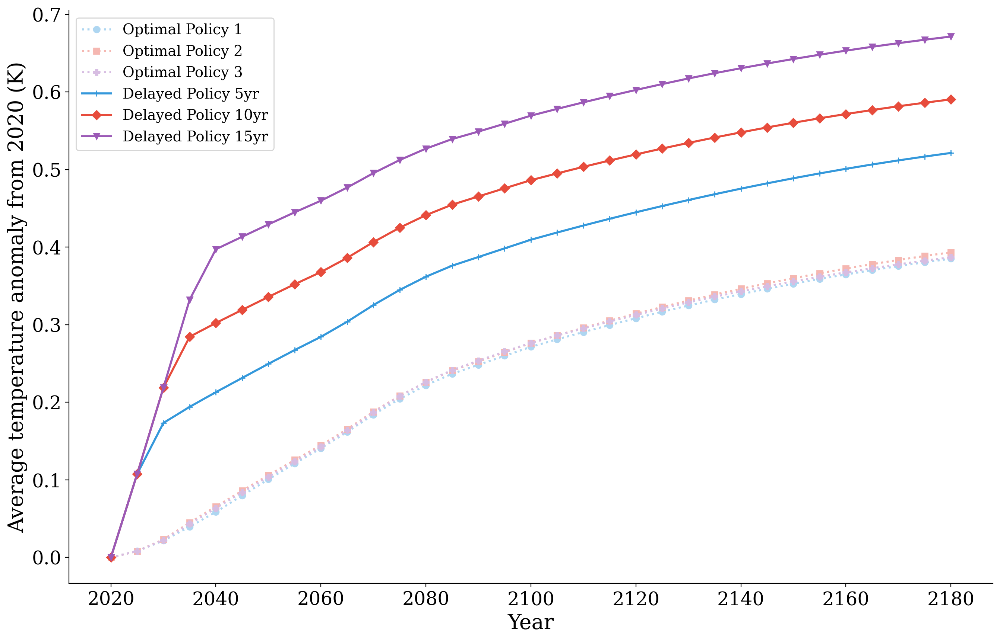

In [40]:
fig, ax = plt.subplots(1)

for file in range(0, N_files):
    ax.plot(tmp_baseline_emission_model.times[:-trigger], np.mean(pickle_obj_list[file].temp_full, axis=0) - np.mean(pickle_obj_list[file].temp_full, axis=0)[0], 
                  color=color_list[file], marker=marker_list[file], 
                  label=pickle_obj_list[file].description[file], markersize=markersize,
                  linestyle=linestyle_list[file], linewidth=linewidth)

    
ax.set_ylabel("Average temperature anomaly from 2020 (K)")
ax.legend()
ax.set_xlabel(x_label)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

### CO$_2$ concentrations

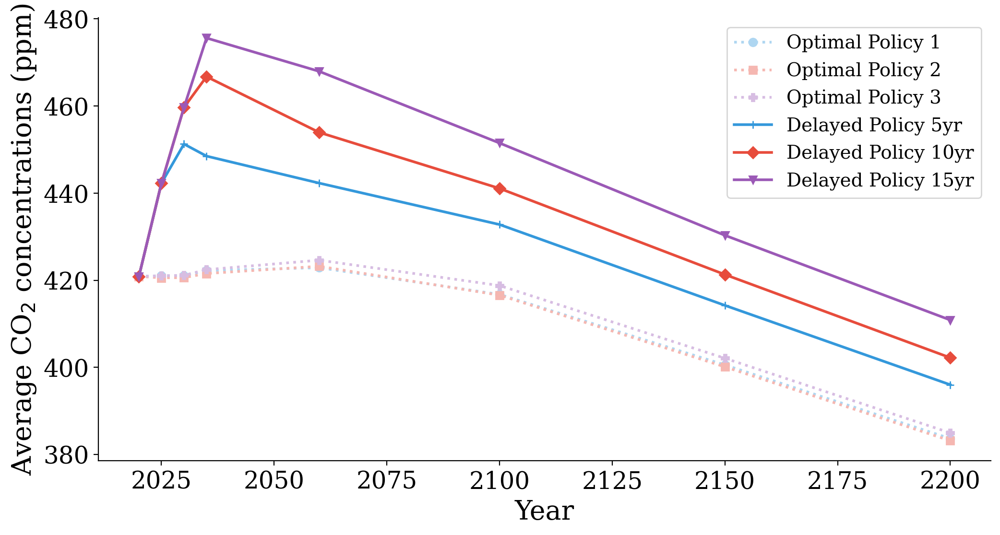

In [17]:
fig, ax = plt.subplots(figsize=(12,6))

for file in range(0, N_files):
    ax.plot(node_times, np.mean(output_obj_list[file].ghg_lvl_path, axis=0), 
                  color=color_list[file], marker=marker_list[file], 
                  label=pickle_obj_list[file].description[file], markersize=markersize,
                  linestyle=linestyle_list[file], linewidth=linewidth)


ax.set_ylabel("Average CO$_2$ concentrations (ppm)")
ax.legend()
ax.set_xlabel(x_label)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, fig_filename_prefix, '-co2.png']), dpi=400)

### Economic damages

Text(0.5, 0, 'Year')

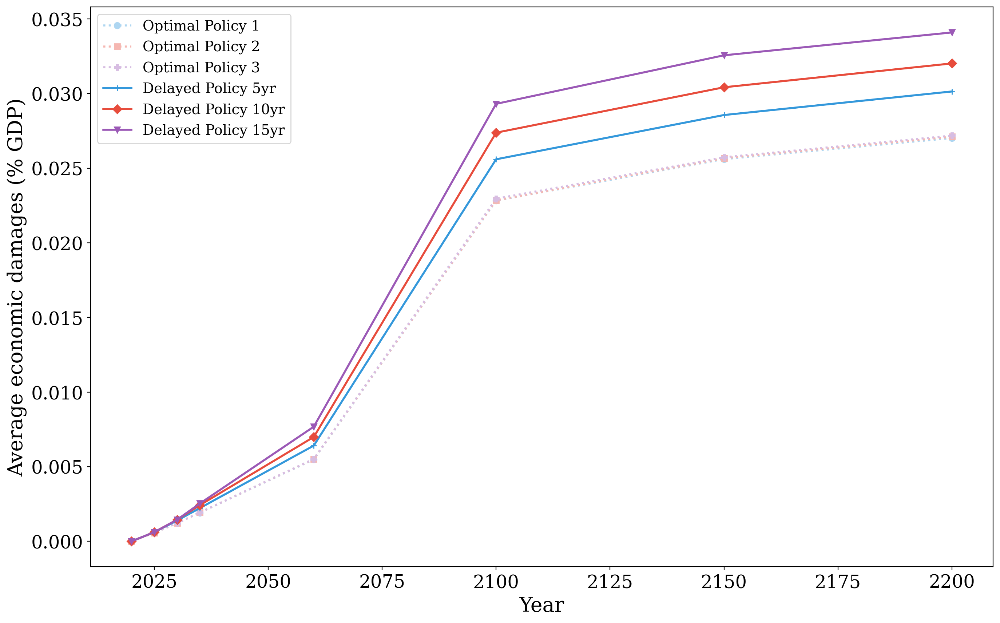

In [42]:
fig, ax = plt.subplots()

for file in range(0, N_files):
    ax.plot(node_times, np.mean(pickle_obj_list[file].econ_dam_path, axis=0), 
                  color=color_list[file], marker=marker_list[file], 
                  label=pickle_obj_list[file].description[file], markersize=markersize,
                  linestyle=linestyle_list[file], linewidth=linewidth)

ax.set_ylabel("Average economic damages (% GDP)")
ax.legend()
ax.set_xlabel(x_label)


Text(0.5, 0, 'Temperature (K)')

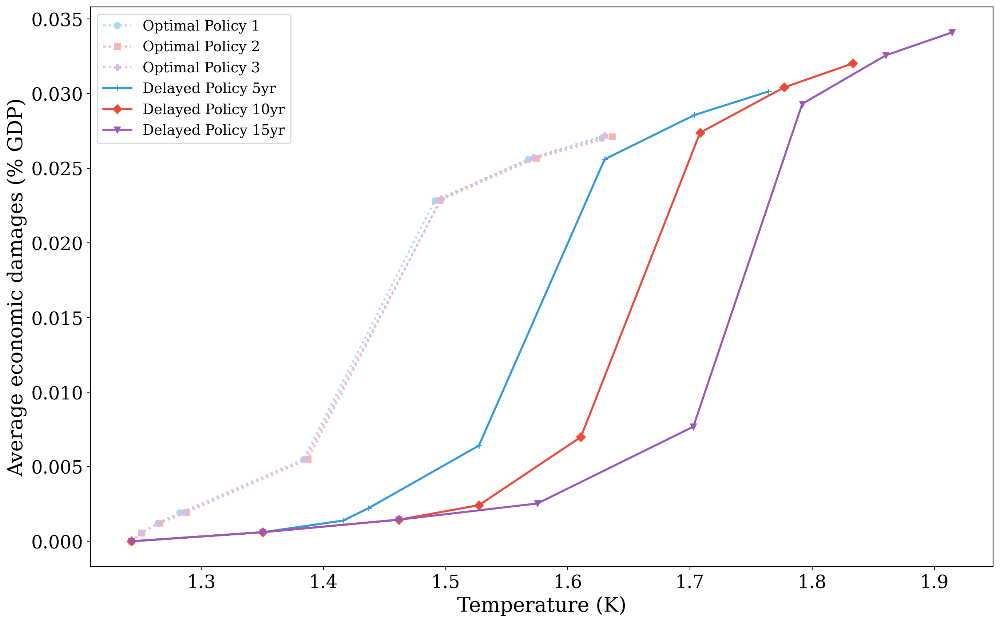

In [43]:
fig, ax = plt.subplots()

for file in range(0, N_files):
    ax.plot(np.mean(pickle_obj_list[file].temp_path, axis=0), np.mean(pickle_obj_list[file].econ_dam_path, axis=0), 
                  color=color_list[file], marker=marker_list[file], 
                  label=pickle_obj_list[file].description[file], markersize=markersize,
                  linestyle=linestyle_list[file], linewidth=linewidth)

ax.set_ylabel("Average economic damages (% GDP)")
ax.legend()
ax.set_xlabel("Temperature (K)")

#### Panels

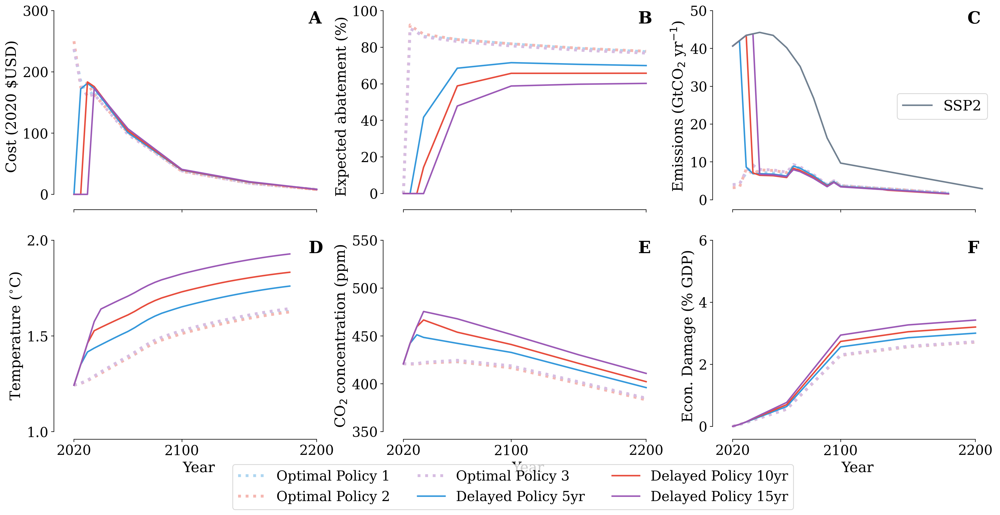

In [18]:
import matplotlib.transforms as mtransforms

fig, ax = plt.subplot_mosaic([['A', 'B', 'C'], ['D', 'E', 'F']], sharex=True,
                             gridspec_kw={'height_ratios': [1, 1], 'width_ratios': [1, 1, 1]},
                            figsize=(22,10))

pref_lw = 3.75
feat_lw = 2

# Helper to pull the scenario label regardless of how description is stored
def _scenario_label(obj, idx):
    desc = getattr(obj, 'description', None)
    if isinstance(desc, (list, tuple)):
        if 0 <= idx < len(desc):
            return desc[idx]
        return desc[-1] if desc else f'Scenario {idx + 1}'
    return desc if desc else f'Scenario {idx + 1}'

legend_handles = []
legend_labels = []

optimal_indices = range(min(3, N_files))
delayed_indices = range(3, N_files)

# Plot the optimal scenarios with thicker lines
for idx in optimal_indices:
    label = _scenario_label(pickle_obj_list[idx], idx)
    color = color_list[idx]
    style = linestyle_list[idx]

    line_A, = ax['A'].plot(node_times, np.mean(output_obj_list[idx].price_path, axis=0),
                  color=color,
                  label=label,
                  linestyle=style, linewidth=pref_lw)
    legend_handles.append(line_A)
    legend_labels.append(label)

    ax['B'].plot(node_times, np.mean(output_obj_list[idx].exp_mit_path, axis=0) * 100,
                  color=color,
                  linestyle=style, linewidth=pref_lw)

    ax['C'].plot(tmp_baseline_emission_model.times[:-trigger], np.mean(pickle_obj_list[idx].emis_gtco2_full, axis=0),
                  color=color,
                  linestyle=style, linewidth=pref_lw)

    ax['D'].plot(tmp_baseline_emission_model.times[:-trigger], np.mean(pickle_obj_list[idx].temp_full, axis=0),
                  color=color,
                  linestyle=style, linewidth=pref_lw)

    ax['E'].plot(node_times, np.mean(output_obj_list[idx].ghg_lvl_path, axis=0),
                  color=color,
                  linestyle=style, linewidth=pref_lw)

    ax['F'].plot(node_times, np.mean(pickle_obj_list[idx].econ_dam_path, axis=0) * 100,
                  color=color,
                  linestyle=style, linewidth=pref_lw)

# Plot the delayed scenarios with thinner lines
for idx in delayed_indices:
    label = _scenario_label(pickle_obj_list[idx], idx)
    color = color_list[idx]
    style = linestyle_list[idx]

    line_A, = ax['A'].plot(node_times, np.mean(output_obj_list[idx].price_path, axis=0),
                  color=color,
                  label=label,
                  linestyle=style, linewidth=feat_lw)
    legend_handles.append(line_A)
    legend_labels.append(label)

    ax['B'].plot(node_times, np.mean(output_obj_list[idx].exp_mit_path, axis=0) * 100,
                  color=color,
                  linestyle=style, linewidth=feat_lw)

    ax['C'].plot(tmp_baseline_emission_model.times[:-trigger], np.mean(pickle_obj_list[idx].emis_gtco2_full, axis=0),
                  color=color,
                  linestyle=style, linewidth=feat_lw)

    ax['D'].plot(tmp_baseline_emission_model.times[:-trigger], np.mean(pickle_obj_list[idx].temp_full, axis=0),
                  color=color,
                  linestyle=style, linewidth=feat_lw)

    ax['E'].plot(node_times, np.mean(output_obj_list[idx].ghg_lvl_path, axis=0),
                  color=color,
                  linestyle=style, linewidth=feat_lw)

    ax['F'].plot(node_times, np.mean(pickle_obj_list[idx].econ_dam_path, axis=0) * 100,
                  color=color,
                  linestyle=style, linewidth=feat_lw)

# plot SSP2 for clarity
ax['C'].plot(tmp_baseline_emission_model.times[:-5], tmp_baseline_emission_model.baseline_gtco2[:-5],
        color='slategrey', label="SSP2", linewidth=feat_lw)
ax['C'].legend(loc='right', fontsize=19)

panels = ['A', 'B', 'C', 'D', 'E', 'F']
for panel in panels:
    ax[panel].set_xticks([2020, 2100, 2200])

# set ticks
ax['A'].set_yticks([0, 100, 200, 300])
ax['B'].set_yticks([0, 20, 40, 60, 80, 100])
ax['C'].set_yticks([0, 10, 20, 30, 40, 50])
ax['D'].set_yticks([1, 1.5, 2])
ax['E'].set_yticks([350, 400, 450, 500, 550])
ax['F'].set_yticks([0, 2, 4, 6])

# set labels
ax['A'].set_ylabel("Cost (2020 $USD)", fontsize=19)
ax['B'].set_ylabel("Expected abatement (%)", fontsize=19)
ax['C'].set_ylabel("Emissions (GtCO$_2$ yr$^{-1}$)", fontsize=19)
ax['D'].set_ylabel("Temperature ($^{\\circ}$C)", fontsize=19)
ax['E'].set_ylabel("CO$_2$ concentration (ppm)", fontsize=19)
ax['F'].set_ylabel("Econ. Damage (% GDP)", fontsize=19)

ax['D'].set_xlabel("Year", fontsize=19)
ax['E'].set_xlabel("Year", fontsize=19)
ax['F'].set_xlabel("Year", fontsize=19)

fig.legend(legend_handles, legend_labels,
           bbox_to_anchor=(0.5, -0.045),
           loc='lower center', ncol=3, fancybox=True, fontsize=18)

# add labels
for label in panels:
    trans = mtransforms.ScaledTranslation(0, 0.0, fig.dpi_scale_trans)
    ax[label].text(0.9, 1.0, label, transform=ax[label].transAxes + trans, fontsize=22, fontweight='bold',
            verticalalignment='top', bbox=dict(facecolor='none', edgecolor='none', pad=1))

sns.despine(trim=True, offset=10)

if SAVE_FIGURES:
    fig.savefig(''.join([basefile, 'pref-runs-NFL.png']),bbox_inches='tight', dpi=400)


In [19]:
for i in range(len(pickle_obj_list)):
    print(np.mean(pickle_obj_list[i].econ_dam_path, axis=0) * 100)

[0.         0.05715209 0.122084   0.1932769  0.55026782 2.28605725
 2.56057714 2.71228937]
[0.         0.05708884 0.12188495 0.1927267  0.55125598 2.28862197
 2.5655682  2.71497899]
[0.         0.05713747 0.12211141 0.19353984 0.55492905 2.30675445
 2.58279392 2.73143247]
[0.         0.06104985 0.13897391 0.22233885 0.63843413 2.56128856
 2.85677918 3.00411022]
[0.         0.0611257  0.14484006 0.24242069 0.69889464 2.73738564
 3.04955182 3.20165769]
[0.         0.06108758 0.14475588 0.25323872 0.77073581 2.94163342
 3.27043247 3.42681548]


In [20]:
for i in range(len(pickle_obj_list)):
    print(np.mean(pickle_obj_list[i].temp_full, axis=0)[0], 
         np.mean(pickle_obj_list[i].temp_full, axis=0)[1],
         np.mean(pickle_obj_list[i].temp_full, axis=0)[4],
         np.mean(pickle_obj_list[i].temp_full, axis=0)[8],
         np.mean(pickle_obj_list[i].temp_full, axis=0)[13],
         np.mean(pickle_obj_list[i].temp_full, axis=0)[18])

1.242799997329712 1.2533936500549316 1.310669019818306 1.3830428570508957 1.478727526962757 1.5324821025133133
1.242799997329712 1.2511978149414062 1.3044590502977371 1.3837860375642776 1.4782259613275528 1.5306017734110355
1.242799997329712 1.2532997131347656 1.3126020282506943 1.3933268189430237 1.4934763982892036 1.5475015491247177
1.242799997329712 1.3503221273422241 1.454269900918007 1.5235194563865662 1.6184858530759811 1.6701447516679764
1.242799997329712 1.3503221273422241 1.5448991656303406 1.6099411994218826 1.698548249900341 1.747864555567503
1.242799997329712 1.3503221273422241 1.6407765448093414 1.7080721110105515 1.7934314906597137 1.8416481018066406


In [21]:
tmp_baseline_emission_model.times[:-trigger], np.mean(pickle_obj_list[0].emis_gtco2_full, axis=0)

(array([2020, 2025, 2030, 2035, 2040, 2045, 2050, 2055, 2060, 2065, 2070,
        2075, 2080, 2085, 2090, 2095, 2100, 2105, 2110, 2115, 2120, 2125,
        2130, 2135, 2140, 2145, 2150, 2155, 2160, 2165, 2170, 2175, 2180]),
 array([4.00482368, 4.14416552, 7.15482569, 9.20808682, 7.18795506,
        7.12373789, 7.05952047, 6.79429811, 6.52907535, 8.9317473 ,
        8.34431907, 7.35003935, 6.35575951, 5.11081953, 3.86587931,
        5.06896096, 3.77448831, 3.64867205, 3.52285578, 3.39703949,
        3.27122322, 3.14540694, 3.01959066, 2.93127206, 2.80382547,
        2.67637884, 2.54893224, 2.42148562, 2.29403901, 2.16659241,
        2.03914579, 1.91169918, 1.78425256]))